In [2]:
import pandas as pd
import numpy as np
import sqlite3
import seaborn as sns
import matplotlib.pyplot as plt
con=sqlite3.connect('database.sqlite')
filtered_data=pd.read_sql_query(
"""
    SELECT*
    FROM Reviews
    WHERE Score!=3
    """,con)

def partition(x):
    if x<3:
        return 0
    return 1

actualscore=filtered_data['Score']
posneg=actualscore.map(partition)
filtered_data['Score']=posneg
print(filtered_data)

            Id   ProductId          UserId                      ProfileName  \
0            1  B001E4KFG0  A3SGXH7AUHU8GW                       delmartian   
1            2  B00813GRG4  A1D87F6ZCVE5NK                           dll pa   
2            3  B000LQOCH0   ABXLMWJIXXAIN  Natalia Corres "Natalia Corres"   
3            4  B000UA0QIQ  A395BORC6FGVXV                             Karl   
4            5  B006K2ZZ7K  A1UQRSCLF8GW1T    Michael D. Bigham "M. Wassir"   
...        ...         ...             ...                              ...   
525809  568450  B001EO7N10  A28KG5XORO54AY                 Lettie D. Carter   
525810  568451  B003S1WTCU  A3I8AFVPEE8KI5                        R. Sawyer   
525811  568452  B004I613EE  A121AA1GQV751Z                    pksd "pk_007"   
525812  568453  B004I613EE   A3IBEVCTXKNOH          Kathy A. Welch "katwel"   
525813  568454  B001LR2CU2  A3LGQPJCZVL9UC                         srfell17   

        HelpfulnessNumerator  HelpfulnessDenominato

In [3]:
from sklearn.utils import resample
final=filtered_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"},keep="first",inplace=False)
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]
final=resample(final,replace=True,n_samples=5000,random_state=123)
final=final.sort_values('Time',axis=0,ascending=True)
print(final)

            Id   ProductId          UserId             ProfileName  \
212447  230258  B00004RYGX   AEPJYN0NAX9N4          Jody L. Schoth   
347552  375943  B0000DBN1L   APWF2542427ZF                     Raj   
125303  135926  B0001217A4  A20Q6AL0RPC1US                J. Giles   
156017  169209  B0001ES9FI  A3RTEGBR71Z2G8        "aussiebeermatt"   
36849    40039  B0000DG4MO  A2BMLTODXV79NB           Ariana Farris   
...        ...         ...             ...                     ...   
156915  170171  B002ZOG29C  A3N96FSBGEAMZQ           Sandy "Sandy"   
85749    93371  B007TGDXMU  A2WMWK5GJCY8SH  Robert Ellentuck "rpe"   
301940  327034  B000SATIVO   AJAS77J3NW4T1                   James   
91735    99791  B006WYUFDU   AAYYRMUPU3JDO                 Lillers   
190529  206591  B000YOQOAC  A17XLNVNQ8GIQE      G. Lake "1233fire"   

        HelpfulnessNumerator  HelpfulnessDenominator  Score        Time  \
212447                     0                       0      1  1014163200   
347552   

In [4]:
final['Score'].value_counts()
x1=final[final['Score']==1]
x2=final[final['Score']==0]
print(x1)
print("**************************************************************************")
print(x2)

            Id   ProductId          UserId             ProfileName  \
212447  230258  B00004RYGX   AEPJYN0NAX9N4          Jody L. Schoth   
347552  375943  B0000DBN1L   APWF2542427ZF                     Raj   
125303  135926  B0001217A4  A20Q6AL0RPC1US                J. Giles   
156017  169209  B0001ES9FI  A3RTEGBR71Z2G8        "aussiebeermatt"   
36849    40039  B0000DG4MO  A2BMLTODXV79NB           Ariana Farris   
...        ...         ...             ...                     ...   
156915  170171  B002ZOG29C  A3N96FSBGEAMZQ           Sandy "Sandy"   
85749    93371  B007TGDXMU  A2WMWK5GJCY8SH  Robert Ellentuck "rpe"   
301940  327034  B000SATIVO   AJAS77J3NW4T1                   James   
91735    99791  B006WYUFDU   AAYYRMUPU3JDO                 Lillers   
190529  206591  B000YOQOAC  A17XLNVNQ8GIQE      G. Lake "1233fire"   

        HelpfulnessNumerator  HelpfulnessDenominator  Score        Time  \
212447                     0                       0      1  1014163200   
347552   

In [5]:
from sklearn.utils import resample
x1=resample(x1,replace=True,n_samples=4220,random_state=123)
x2=resample(x2,replace=True,n_samples=4220,random_state=123)
print(x1)
print("*************************************************************************************************")
print(x2)

            Id   ProductId          UserId  \
513926  555655  B005580CAK  A3SC2PVERT3CXN   
120658  130811  B000NOYZV8  A3FM2MT33PIZX0   
16731    18260  B003IF92AS   A9FCZFB4QC0R1   
153469  166402  B000VZTTQ0   AAUENSS6MUTO7   
37922    41184  B000SATUWG  A2HY664N9OTOQB   
...        ...         ...             ...   
109211  118533  B005A1LH6U   A50LYW94CNSEZ   
391336  423129  B005IPJTZE  A1O3X2RXPIB8XF   
243307  263854  B00811X8P4  A15OL93RMBLY7S   
237151  257271  B002TSA91Q   AGXV8E7XK9J6H   
497685  538044  B000HZIII4  A2SEVDQ0PXL6P7   

                               ProfileName  HelpfulnessNumerator  \
513926                          ITRIHARDER                     0   
120658                              Dave R                     0   
16731                               J. Lor                     0   
153469          Gary Hardesty "book maven"                     0   
37922                       Scott F. Downs                     5   
...                                    

In [6]:
final=pd.concat([x1,x2])
print(final)

            Id   ProductId          UserId                 ProfileName  \
513926  555655  B005580CAK  A3SC2PVERT3CXN                  ITRIHARDER   
120658  130811  B000NOYZV8  A3FM2MT33PIZX0                      Dave R   
16731    18260  B003IF92AS   A9FCZFB4QC0R1                      J. Lor   
153469  166402  B000VZTTQ0   AAUENSS6MUTO7  Gary Hardesty "book maven"   
37922    41184  B000SATUWG  A2HY664N9OTOQB              Scott F. Downs   
...        ...         ...             ...                         ...   
162676  176377  B000FDDESM  A10CMFLN1PVPE5                  Bob G "BG"   
287361  311295  B004748F2A  A2NP8RNW9T5BQF              A. Brazhnykova   
251019  272161  B005GCODPA  A2PJLV8TZJ0NAI                   M. BRACCO   
155326  168466  B0001ES9F8   A7HO72BEUSQUZ      T. Gonzalez "trishalg"   
280504  303931  B0025U9YFK  A2J1BRXFFQR7R8                        cyli   

        HelpfulnessNumerator  HelpfulnessDenominator  Score        Time  \
513926                     0        

In [7]:
final=final.sort_values('Time',axis=0,ascending=True)
print(final)


            Id   ProductId          UserId             ProfileName  \
212447  230258  B00004RYGX   AEPJYN0NAX9N4          Jody L. Schoth   
347552  375943  B0000DBN1L   APWF2542427ZF                     Raj   
347552  375943  B0000DBN1L   APWF2542427ZF                     Raj   
125303  135926  B0001217A4  A20Q6AL0RPC1US                J. Giles   
156017  169209  B0001ES9FI  A3RTEGBR71Z2G8        "aussiebeermatt"   
...        ...         ...             ...                     ...   
79327    86253  B000084E6V  A3RHPGU1HNB16G           Andrew Hocker   
85749    93371  B007TGDXMU  A2WMWK5GJCY8SH  Robert Ellentuck "rpe"   
301940  327034  B000SATIVO   AJAS77J3NW4T1                   James   
190529  206591  B000YOQOAC  A17XLNVNQ8GIQE      G. Lake "1233fire"   
85749    93371  B007TGDXMU  A2WMWK5GJCY8SH  Robert Ellentuck "rpe"   

        HelpfulnessNumerator  HelpfulnessDenominator  Score        Time  \
212447                     0                       0      1  1014163200   
347552   

In [8]:
import gensim
import re
import nltk
from bs4 import BeautifulSoup
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

i=0;
list_of_sent=[]
for sent in final['Text'].values:
    filtered_sentence=[]
    soup=BeautifulSoup(sent)
    sent=soup.get_text()
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue
    list_of_sent.append(filtered_sentence)
    
print(list_of_sent)
    

[['just', 'hilarious', 'my', 'favorite', 'part', 'is', 'the', 'dining', 'room', 'scene', 'with', 'all', 'the', 'singing', 'and', 'dancing', 'classic', 'moment', 'not', 'to', 'be', 'missed', 'winona', 'rider', 'and', 'geena', 'davis', 'are', 'spectacular', 'in', 'this', 'movie', 'and', 'michael', 'keaton', 'is', 'unbelievably', 'funny', 'i', 'couldnt', 'stop', 'laughing', 'great', 'family', 'movie', 'will', 'keep', 'you', 'in', 'stitches'], ['this', 'is', 'awesome', 'tastes', 'like', 'its', 'a', 'complex', 'home', 'mixture', 'of', 'spices', 'etc', 'for', 'chai', 'tea', 'but', 'its', 'all', 'in', 'a', 'simple', 'tea', 'bag', 'amazing'], ['this', 'is', 'awesome', 'tastes', 'like', 'its', 'a', 'complex', 'home', 'mixture', 'of', 'spices', 'etc', 'for', 'chai', 'tea', 'but', 'its', 'all', 'in', 'a', 'simple', 'tea', 'bag', 'amazing'], ['yes', 'summers', 'coming', 'rather', 'than', 'drinking', 'tea', 'as', 'sweet', 'as', 'breakfast', 'cereal', 'consider', 'glass', 'fill', 'with', 'ice', 'pou

In [9]:
w2v_model=gensim.models.Word2Vec(list_of_sent,min_count=5,size=50,workers=4)
words=list(w2v_model.wv.vocab)
print(len(words))
print(len(words[0]))

6389
4


In [10]:
sent_vectors=[]

for sent in list_of_sent:
    sent_vec=np.zeros(50)
    cnt_words=0
    for word in sent:
        try:
            vec=w2v_model.wv[word]
            sent_vec+=vec
            cnt_words+=1
        except:
            pass
        
    sent_vec/=cnt_words
    sent_vectors.append(sent_vec)


print(sent_vectors)

[array([-0.38223105,  0.20359603, -0.29445827,  0.25876692,  0.27944735,
        0.02642287,  0.3571557 , -0.03740246, -0.46683572,  0.03217666,
       -0.41307692,  0.0143035 , -0.5920298 ,  0.50347962, -0.71640886,
        0.30681372, -0.13701721, -0.02914264,  0.3660859 ,  0.44574108,
        0.39817309, -0.45104733, -0.03472914,  0.43656843,  0.2477774 ,
        0.36997062, -0.00621712,  0.09295271, -0.19461152,  0.3628859 ,
       -0.05811327,  0.32928153, -0.18399913, -0.29783833,  0.24550757,
        0.22584177,  0.01195264, -0.41018845, -0.22281219,  0.08803795,
       -0.13294204,  0.0579085 ,  0.48883711, -0.14931846,  0.39863212,
        0.18980174, -0.21834758, -0.18601129,  0.02696972, -0.20163248]), array([ 0.28834013, -0.34611308,  0.27871831,  1.08434082,  0.88794947,
       -0.28969422,  0.44448566,  0.41417888, -0.39712022,  0.15820725,
       -0.70026158,  0.30200043, -0.64400345,  0.45778139, -0.68993907,
        0.60661736, -0.32268496,  0.02749234,  0.00376702,  0

In [28]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(sent_vectors)
print(X)

[[ 0.09821263  0.6258192   0.38507515 ... -1.2013587  -0.71799976
  -0.45916536]
 [ 2.88520324 -2.6307053   2.5436773  ... -1.68152665 -2.36494046
   1.33667031]
 [ 2.88520324 -2.6307053   2.5436773  ... -1.68152665 -2.36494046
   1.33667031]
 ...
 [ 0.03708774 -0.48237468  0.11796309 ...  0.70644569  0.32494069
   0.05843806]
 [ 0.62125581  0.38286555  0.6759768  ...  0.1089683  -0.5246859
  -0.471533  ]
 [ 1.56401599 -0.95727394  0.56055674 ... -1.26914767  0.80077885
   1.64421008]]


In [29]:
from sklearn.neighbors import NearestNeighbors
neigh=NearestNeighbors(n_neighbors=100)
nbrs=neigh.fit(X)
distances,indices=nbrs.kneighbors(X)
print(distances[:,99])

[5.41504624 7.12666341 7.12666341 ... 4.50027661 4.21293715 6.52201701]


In [30]:
print(len(distances[:,99]))
distances=distances[:,99]
print(distances)

8440
[5.41504624 7.12666341 7.12666341 ... 4.50027661 4.21293715 6.52201701]


In [31]:
print(len(indices[:,99]))
index=indices[:,99]
print(index)

8440
[1608 5336 5336 ... 3425 2724 1826]


In [32]:
distances=np.sort(distances)
print(distances)


[ 3.19353398  3.32969112  3.32969112 ... 18.66653088 18.66653088
 18.66653088]


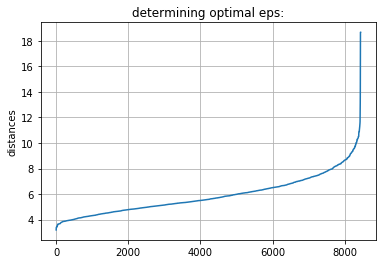

In [33]:
plt.plot(distances)
plt.ylabel("distances")
plt.title("determining optimal eps:")
plt.grid()
plt.show()

In [34]:
from sklearn.cluster import DBSCAN
model=DBSCAN(min_samples=100,eps=9,n_jobs=-1)
model.fit(X)
print(model.labels_)

[0 0 0 ... 0 0 0]


In [35]:
print(model.labels_[100:1000])

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1  0 -1  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0

In [37]:
p=model.fit_predict(X)

In [38]:
index = []
for i in range(len(p)):
    if p[i] == 0:
        index.append(i)
print(len(index))

8408


In [40]:
text = []
for i in range(len(index)):
    text.append(list_of_sent[index[i]])

In [41]:
from wordcloud import WordCloud
from matplotlib.pyplot import figure
t_b = ''
for j in range(len(text)):
    for i in range(len(text[j])):
        t_b = t_b + text[j][i] + ' '
#print(t_b)
word_cloud = WordCloud(relative_scaling = 1.0).generate(t_b)
plt.imshow(word_cloud,aspect='auto')
plt.axis('off')
plt.show()

ModuleNotFoundError: No module named 'wordcloud'